In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/massachusettsbuildings/Test/Images/23579005_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23578960_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23429155_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/24478900_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/22828990_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23429020_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/22828930_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23429080_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23579050_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23879080_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23728930_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/24479005_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/22829050_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/23729035_15.tiff
/kaggle/input/massachusettsbuildings/Test/Images/22978945_15.tiff
/kaggle/in

# Abstract
A satellite imagery dataset from Massachusetts buildings and roads are used to implement UNET network and analize it's characteristics. The goal is to design a UNET model using Pytorch to be trained later with the Massachusetts buildings dataset so it can recognize the building's rooftop in each image. Once the model is trained with the buildings dataset, transfer learning is implemented so the model can be trained to recognize the roads in each image.
https://www.cs.toronto.edu/~vmnih/data/

# UNET Model
The UNET architecture is widely used for semantic segmentation. This model follows an encoder-decoder cascade structure, where the encoder gradually compresses information into a lower-dimensional representation. Then the decoder decodes this information back to the original image dimension. In addition to this, the model consists in skip connections which enable the flow of information from the encoder side to the decoder side, enabling the model to make better predictions. Specifically, as we go deeper, the encoder processes information at higher levels of abstraction. This simply means that at the initial layers, the feature maps of the encoder capture low-level details about object texture and edges, and as we gradually go deeper, the features capture high-level information about object shapes and categories.
https://pyimagesearch.com/2021/11/08/u-net-training-image-segmentation-models-in-pytorch/

The UNET architecture is implemented in the next cell.

In [2]:
import torch
import torch.nn as nn
from torchvision import transforms

class Unet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super(Unet, self).__init__()
        #channels = [in_channels, 64, 128, 256, 512, 1024]
        channels = [in_channels, 32, 64, 128, 256, 512]
        self.encoder = nn.ModuleList()
        self.decoder = nn.ModuleList()
        self.conv = nn.Conv2d(channels[1], out_channels, kernel_size=1)

        # Encoder cascade structure.
        for i in range(len(channels)-1):
            if(i > 0):
                self.encoder.append(nn.MaxPool2d(kernel_size=2, stride=2))
            self.encoder.append(nn.Sequential(nn.Conv2d(channels[i], channels[i+1], kernel_size=3, padding=1, bias=False),
                                              nn.BatchNorm2d(channels[i+1]),
                                              nn.ReLU(),
                                              nn.Conv2d(channels[i+1], channels[i+1], kernel_size=3, padding=1, bias=False),
                                              nn.BatchNorm2d(channels[i+1]),
                                              nn.ReLU()))

        # Decoder cascade structure.
        channels = channels[1:] # Delete the first element.
        channels = channels[::-1] # Reverse array.
        for i in range(len(channels)-1):
            self.decoder.append(nn.ConvTranspose2d(channels[i], channels[i+1], kernel_size=2, stride=2))
            self.decoder.append(nn.Sequential(nn.Conv2d(channels[i], channels[i+1], kernel_size=3, padding=1, bias=False),
                                              nn.BatchNorm2d(channels[i+1]),
                                              nn.ReLU(),
                                              nn.Conv2d(channels[i+1], channels[i+1], kernel_size=3, padding=1, bias=False),
                                              nn.BatchNorm2d(channels[i+1]),
                                              nn.ReLU()))

    def forward(self, x):
        skips = []
        for i in range(len(self.encoder)):
            #print(f"Enc: {x.shape}, {i}")
            x = self.encoder[i](x)
            if(i % 2 == 0):
                skips.append(x)

        skips = skips[:-1] # Delete the last element.
        skips = skips[::-1] # Reverse array.
        for i in range(len(self.decoder)):
            #print(f"Dec: {x.shape}, {i}")
            if(i % 2 == 1):
                skip = transforms.CenterCrop(x.shape[2:])(skips[i//2])
                x = torch.cat((skip, x), dim=1)
            x = self.decoder[i](x)

        return self.conv(x)

# Plot Funtion
A function used to plot 5 randomly chosed images from the dataset. It will be helpful to compare the images and it's targets with the predictions made from the trained model.

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import random

def plot_dataset(dataset, preds=None, n_data=5, file_name=""):
    plot_path="/kaggle/working/"
    if preds == None:
        fig, axs = plt.subplots(nrows=n_data, ncols=2, figsize=(20, 20))
    else:
        fig, axs = plt.subplots(nrows=n_data, ncols=3, figsize=(20, 20))
        
    for i in range(n_data):
        rand_i = random.choice(range(len(dataset)))
        data = dataset[rand_i]
        image = np.transpose(data[0], (1, 2, 0))
        target = np.transpose(data[1], (1, 2, 0))
        if preds == None:
            axs[i,0].imshow(image) # Image.
            axs[i,1].imshow(target) # Target.
            axs[i,0].set_title("Image")
            axs[i,1].set_title("Target")

        else:
            if(len(preds) == len(dataset)):
                pred = preds[rand_i]
                pred = np.transpose(pred, (1, 2, 0))
                axs[i,0].imshow(image) # Image.
                axs[i,1].imshow(target) # Target.
                axs[i,2].imshow(pred) # Prediction.
                axs[i,0].set_title("Image")
                axs[i,1].set_title("Target")
                axs[i,2].set_title("Prediction")

    # Set the layout of the figure and display it
    plt.subplots_adjust(wspace=-0.7)
    plt.show()
    # Save the plot.
    if file_name != "":
        plt.savefig(plot_path + file_name + ".png")

# Dataset Class
A class which inherits the Dataset class from Pytorch to make the data handle easier. 

In [5]:
import os # To walk through the directories.
from torch.utils.data import Dataset
from torchvision import transforms
import cv2

class MassachusettsDataset(Dataset):
    def __init__(self, dataset_path):
        self.images_path = dataset_path + "/Images/"
        self.images_list = sorted(os.listdir(self.images_path))
        self.targets_path = dataset_path + "/Targets/"
        self.targets_list = sorted(os.listdir(self.targets_path))
        
    def __len__(self):
        return len(self.images_list)
    
    def __getitem__(self, i):
        image = cv2.imread(self.images_path + self.images_list[i]) # Read the image in color mode.
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) # Swap the image channels from BGR to RGB.
        target = cv2.imread(self.targets_path + self.targets_list[i]) # Read the image in grayscale mode.
        target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)
        target = target[:,:,0] # Just one channel (the red one).
        
        # Apply the transformations to both image and its mask.
        image = transforms.ToTensor()(image)
        target = transforms.ToTensor()(target)
            
        return (image, target)

# Massachusetts Buildings Dataset
First, the Massachusetts buildings dataset is extracted from the database and is preprocessed. This task consists of the following steps:
- The images are originally big (1500 x 1500), so they are patched to smaller images (256 x 256).
- Since some of the original images have a blank space, some patched images will be almost blank. So, those blank patched images are removed.
- Also, some of the original images have green space (no buildings, just trees). So, those patched images with less than 1% of building information are removed.

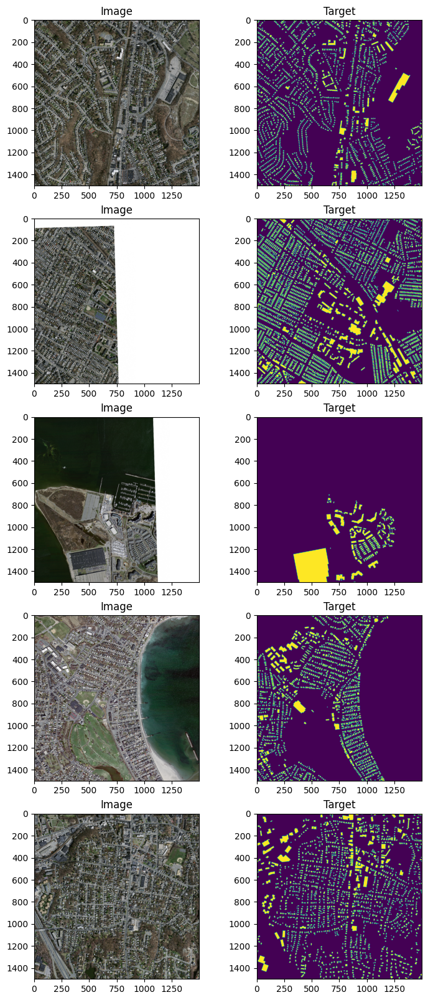

Dimension of image data: torch.Size([2570, 3, 256, 256]).
Dimension of target data: torch.Size([2570, 1, 256, 256]).


In [5]:
import torch

images = []
targets = []
patch_size = 256
dataset_path = "/kaggle/input/massachusettsbuildings/Train"
dataset = MassachusettsDataset(dataset_path)

plot_dataset(dataset)

for data in dataset:
    image = data[0]
    target = data[1]
    for i in range(0, image.shape[1]-patch_size, patch_size):
        for j in range(0, image.shape[2]-patch_size, patch_size):
            image_patch = image[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
            white_pixels = (image_patch[0,0] == 1).sum()
            if(white_pixels < 0.01*(patch_size**2)): # Less than 1% of the image is blank space (no information).
                target_patch = target[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
                black_pixels = np.unique(target_patch, return_counts=True)[1][0]
                if(black_pixels < 0.99*(patch_size**2)): # At least more than 1% is building information.
                    images.append(image_patch)
                    targets.append(target_patch)
                
images = torch.cat(images)
targets = torch.cat(targets)

print(f"Dimension of image data: {images.shape}.")
print(f"Dimension of target data: {targets.shape}.")

Now, the preprocessed dataset is divided into groups before getting into the model.

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


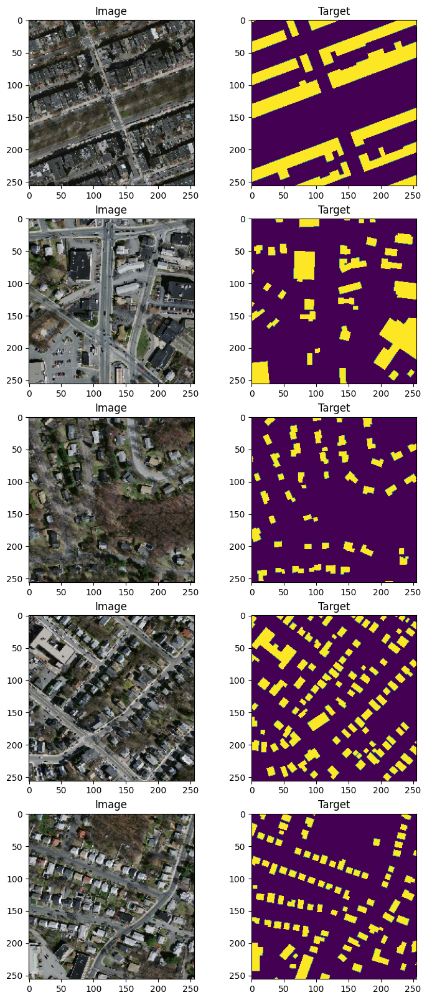

Size of trainset after spliting the dateset: 2313.
Size of testset after spliting the dateset: 257.
Size of train loader (with batch size 32): 73.
Size of test loader (with batch size 32): 9.


In [6]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader

dataset = train_test_split(images, targets, test_size=0.1, random_state=32)

trainset = TensorDataset(dataset[0], dataset[2]) # Creates your dataset.
testset = TensorDataset(dataset[1], dataset[3]) # Creates your dataset.

plot_dataset(testset)

print(f"Size of trainset after spliting the dateset: {len(trainset)}.")
print(f"Size of testset after spliting the dateset: {len(testset)}.")

batch_size = 32 # Hyperparameter.
pin_memory = True if torch.cuda.is_available() else False
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, pin_memory=pin_memory, num_workers=os.cpu_count()) # shuffle=True to reshuffle at every epoch.
test_loader = DataLoader(testset, batch_size=batch_size, shuffle=False, pin_memory=pin_memory, num_workers=os.cpu_count()) # shuffle=True to reshuffle at every epoch.

print(f"Size of train loader (with batch size {batch_size}): {len(train_loader)}.") # ceil(len(trainset)/batch_size).
print(f"Size of test loader (with batch size {batch_size}): {len(test_loader)}.") # ceil(len(testset)/batch_size).

# Configurations and Utilities
Here, the model hyperparameters and functions are specified, such as, the loss function, the metric function for the accuracy, the optimizer to update the parameters, etc. Since this is a binary class issue, the loss function to be used is the BCE loss function and the optimizer is the Adam function, and, IOU (Binary Jaccard) is used as a metric function for semantic segmentation.

In [7]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchmetrics import Dice
from torchmetrics.classification import BinaryJaccardIndex

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device being used: {device}.")

epochs = 30 # Hyperparameter.
lr = 0.001 # Hyperparameter.

model = Unet()
model = model.to(device=device) # Move the model parameters from CPU to GPU.

#criterion = nn.BCELoss() # Loss function.
criterion = nn.BCEWithLogitsLoss() # Sigmid and BCE loss function.
criterion = criterion.to(device=device) # Move the model parameters from CPU to GPU.

optimizer = optim.Adam(model.parameters(), lr=lr) # Hyperparameter.
# optimizer = optim.SGD(Model.parameters(), lr=LearningRate) # Hyperparameter.

lr_decay = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1) # Decay lr by a factor of 0.1 every 15 epochs.

metric = BinaryJaccardIndex() # IOU statistic.
# metric = Dice(average='micro')
metric = metric.to(device)

Device being used: cuda.


# Training Loop
All ready to train the model. In this loop, the training process is held. Since the parameters are randomly initialized, the amount of epochs are 30 and the learning rate is reduced to improve the process after some epoches (see the Configuration and Utilities cell).

In [8]:
from tqdm import tqdm
import time

start_time = time.time()
train_loss = []
test_loss = []
best_loss = float('inf')
best_model = model.state_dict()
for epoch in range(epochs):
    train_loss.append(0)
    model.train() # Set model to training mode.
    for (images, targets) in tqdm(train_loader, total=len(train_loader)):
        images = images.to(device)
        targets = targets.to(device)
                                          
        # Forward pass.
        preds = model(images)
        loss = criterion(preds, targets.type(torch.float32))
        #loss = 1-metric(preds, targets)
        train_loss[-1] += loss.item()

        # Backward and optimize.
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    train_loss[-1] /= (len(trainset)/batch_size)
            
    with torch.no_grad():
        test_loss.append(0)
        accuracy = 0
        model.eval() # Set model to evaluate mode.
        for (images, targets) in tqdm(test_loader, total=len(test_loader)):
            images = images.to(device)
            targets = targets.to(device)
        
            # Forward pass.
            preds = model(images)
            loss = criterion(preds, targets.type(torch.float32))
            #loss = 1-metric(preds, targets)
            test_loss[-1] += loss.item()
            
            # Statistics
            preds = (torch.sigmoid(preds) > 0.5)
            accuracy += metric(preds, targets) # IOU statistic.
        test_loss[-1] /= (len(testset)/batch_size)
        accuracy /= (len(testset)/batch_size)
        
        # Records the best accuracy.
        if(best_loss > test_loss[-1]): 
            best_loss = test_loss[-1]
            best_model = model.state_dict()

    lr_decay.step()
    print (f"Epoch: {epoch+1}/{epochs}, Train loss: {train_loss[-1]:.4f}, Test loss: {test_loss[-1]:.4f}, Accuracy: {accuracy:.4f}.")

print(f"Finished Training. Best loss: {best_loss:.4f}")
print("Total time: {} minutes.".format(round((time.time() - start_time)/60, 2)))

100%|██████████| 9/9 [00:04<00:00,  2.14it/s]


Epoch: 1/30, Train loss: 0.4006, Test loss: 0.4425, Accuracy: 0.4674.


100%|██████████| 9/9 [00:04<00:00,  2.11it/s]


Epoch: 2/30, Train loss: 0.2643, Test loss: 0.2598, Accuracy: 0.6247.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 3/30, Train loss: 0.2200, Test loss: 0.2498, Accuracy: 0.6300.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 4/30, Train loss: 0.2015, Test loss: 0.2267, Accuracy: 0.6488.


100%|██████████| 9/9 [00:04<00:00,  2.12it/s]


Epoch: 5/30, Train loss: 0.1938, Test loss: 0.3913, Accuracy: 0.5329.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 6/30, Train loss: 0.1795, Test loss: 0.1900, Accuracy: 0.7106.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 7/30, Train loss: 0.1750, Test loss: 0.1930, Accuracy: 0.7065.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 8/30, Train loss: 0.1693, Test loss: 0.1814, Accuracy: 0.7278.


100%|██████████| 9/9 [00:04<00:00,  2.07it/s]


Epoch: 9/30, Train loss: 0.1661, Test loss: 0.1893, Accuracy: 0.7191.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 10/30, Train loss: 0.1627, Test loss: 0.1744, Accuracy: 0.7340.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 11/30, Train loss: 0.1528, Test loss: 0.1667, Accuracy: 0.7500.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 12/30, Train loss: 0.1513, Test loss: 0.1659, Accuracy: 0.7541.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 13/30, Train loss: 0.1493, Test loss: 0.1676, Accuracy: 0.7494.


100%|██████████| 9/9 [00:04<00:00,  2.06it/s]


Epoch: 14/30, Train loss: 0.1486, Test loss: 0.1654, Accuracy: 0.7540.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 15/30, Train loss: 0.1476, Test loss: 0.1641, Accuracy: 0.7580.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 16/30, Train loss: 0.1470, Test loss: 0.1672, Accuracy: 0.7437.


100%|██████████| 9/9 [00:04<00:00,  2.11it/s]


Epoch: 17/30, Train loss: 0.1460, Test loss: 0.1633, Accuracy: 0.7597.


100%|██████████| 9/9 [00:04<00:00,  2.08it/s]


Epoch: 18/30, Train loss: 0.1454, Test loss: 0.1629, Accuracy: 0.7590.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 19/30, Train loss: 0.1448, Test loss: 0.1630, Accuracy: 0.7564.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 20/30, Train loss: 0.1443, Test loss: 0.1646, Accuracy: 0.7597.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 21/30, Train loss: 0.1424, Test loss: 0.1624, Accuracy: 0.7626.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 22/30, Train loss: 0.1422, Test loss: 0.1624, Accuracy: 0.7595.


100%|██████████| 9/9 [00:04<00:00,  2.12it/s]


Epoch: 23/30, Train loss: 0.1415, Test loss: 0.1625, Accuracy: 0.7605.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 24/30, Train loss: 0.1414, Test loss: 0.1622, Accuracy: 0.7614.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 25/30, Train loss: 0.1416, Test loss: 0.1629, Accuracy: 0.7581.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 26/30, Train loss: 0.1413, Test loss: 0.1624, Accuracy: 0.7618.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 27/30, Train loss: 0.1412, Test loss: 0.1624, Accuracy: 0.7622.


100%|██████████| 9/9 [00:04<00:00,  2.10it/s]


Epoch: 28/30, Train loss: 0.1408, Test loss: 0.1624, Accuracy: 0.7611.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]


Epoch: 29/30, Train loss: 0.1412, Test loss: 0.1626, Accuracy: 0.7608.


100%|██████████| 9/9 [00:04<00:00,  2.09it/s]

Epoch: 30/30, Train loss: 0.1412, Test loss: 0.1630, Accuracy: 0.7599.
Finished Training. Best loss: 0.1622
Total time: 82.65 minutes.


Now, a plot is made to show the training loss during the  training process.

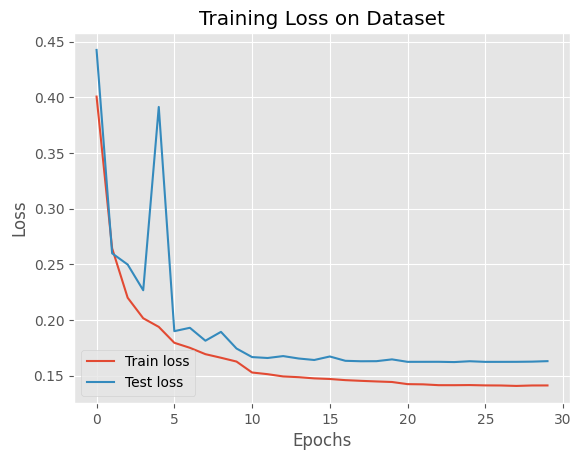

In [9]:
plot_path = "/kaggle/working/TrainingLoss.png"

# Plot the training loss.
plt.style.use("ggplot")
plt.figure()
plt.plot(train_loss, label="Train loss")
plt.plot(test_loss, label="Test loss")
plt.title("Training Loss on Dataset")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(plot_path)

Then, the trained model is saved as it will be used for testing the model and for transfer learning later.

In [10]:
model_path = "/kaggle/working/MassachusettsBuildings.pth"
torch.save(best_model, model_path)

# Testing Process
The trained model is tested with some new images which weren't used in the training process. First, the images form the testset are to be preprocessed and patched the same way as the images form the trainig process.

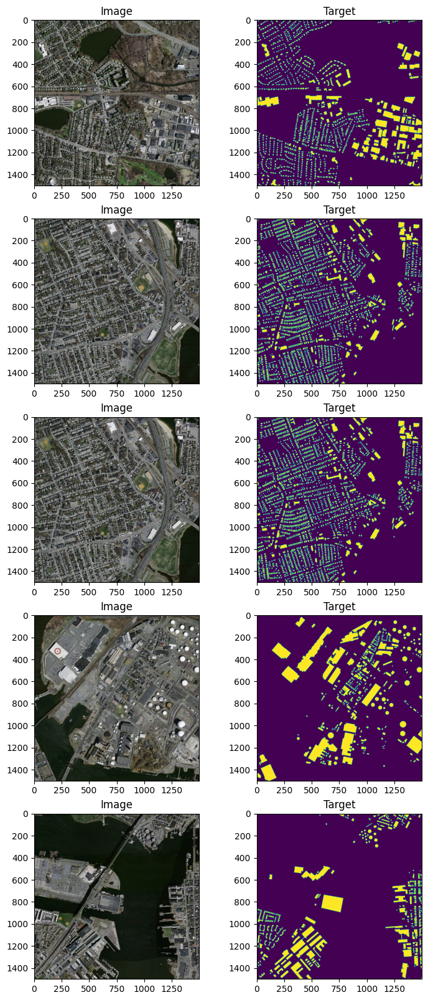

Dimension of image data: torch.Size([302, 3, 256, 256]).
Dimension of target data: torch.Size([302, 1, 256, 256]).


<Figure size 640x480 with 0 Axes>

In [11]:
import torch

images = []
targets = []
patch_size = 256
dataset_path = "/kaggle/input/massachusettsbuildings/Test"
dataset = MassachusettsDataset(dataset_path)

plot_dataset(dataset, file_name="Buildings")

for data in dataset:
    image = data[0]
    target = data[1]
    for i in range(0, image.shape[1]-patch_size, patch_size):
        for j in range(0, image.shape[2]-patch_size, patch_size):
            image_patch = image[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
            white_pixels = (image_patch[0,0] == 1).sum()
            if(white_pixels < 0.01*(patch_size**2)): # Less than 1% of the image is blank space (no information).
                target_patch = target[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
                black_pixels = np.unique(target_patch, return_counts=True)[1][0]
                if(black_pixels < 0.99*(patch_size**2)): # At least more than 1% is building information.
                    images.append(image_patch)
                    targets.append(target_patch)
                
images = torch.cat(images)
targets = torch.cat(targets)

print(f"Dimension of image data: {images.shape}.")
print(f"Dimension of target data: {targets.shape}.")

Some random images from the testset are plotted.

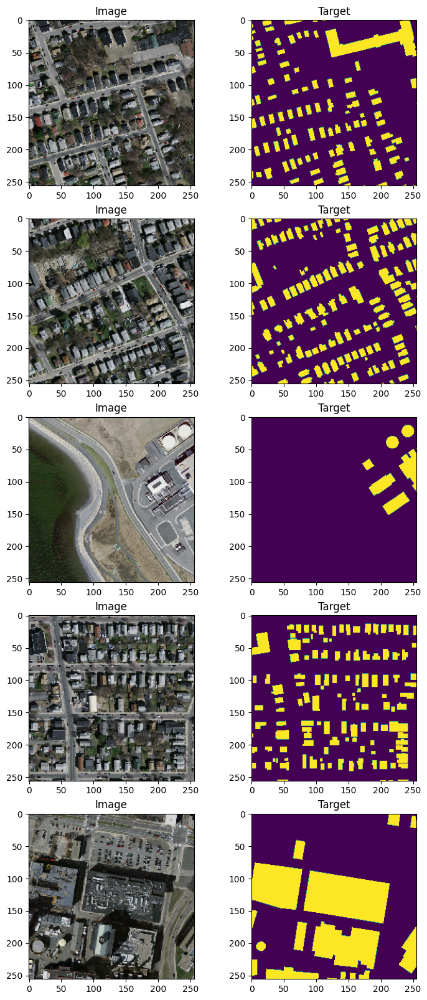

Size of testset after spliting the dateset: 302.


<Figure size 640x480 with 0 Axes>

In [12]:
import torch
from torch.utils.data import TensorDataset, DataLoader

testset = TensorDataset(images, targets) # Creates your dataset.

plot_dataset(testset, file_name="BuildingsPatch")

print(f"Size of testset after spliting the dateset: {len(testset)}.")

# Configurations and Utilities
Now, the saved model is used to recognize the buildings from each image. This way, the accuracy of this model is checked. 

In [13]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchmetrics import Dice
from torchmetrics.classification import BinaryJaccardIndex

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device being used: {device}.")

model_path = "/kaggle/input/massachusettsbuildingsmodel/MassachusettsBuildings.pth"
model = Unet()
model.load_state_dict(torch.load(model_path, map_location=device)) # It takes the loaded dictionary, not the path file itself.
model = model.to(device=device) # Move the model parameters from CPU to GPU.

#criterion = nn.BCELoss() # Loss function.
criterion = nn.BCEWithLogitsLoss() # Sigmid and BCE loss function.
criterion = criterion.to(device=device) # Move the model parameters from CPU to GPU.

metric = BinaryJaccardIndex() # IOU statistic.
# metric = Dice(average='micro')
metric = metric.to(device)

Device being used: cuda.


# Testing Loop
Similar to the Training Loop cell. Here, the accuracy is only in the loop, the loss function and the optimazer are not necessary because the model is not being trained. In the end, the images are ploted to compare the targets with the predictions made by the trained model. An accuracy of 66.09% is achieved.

Finished Testing. Accuracy: 0.6609
Total time: 0.04 minutes.


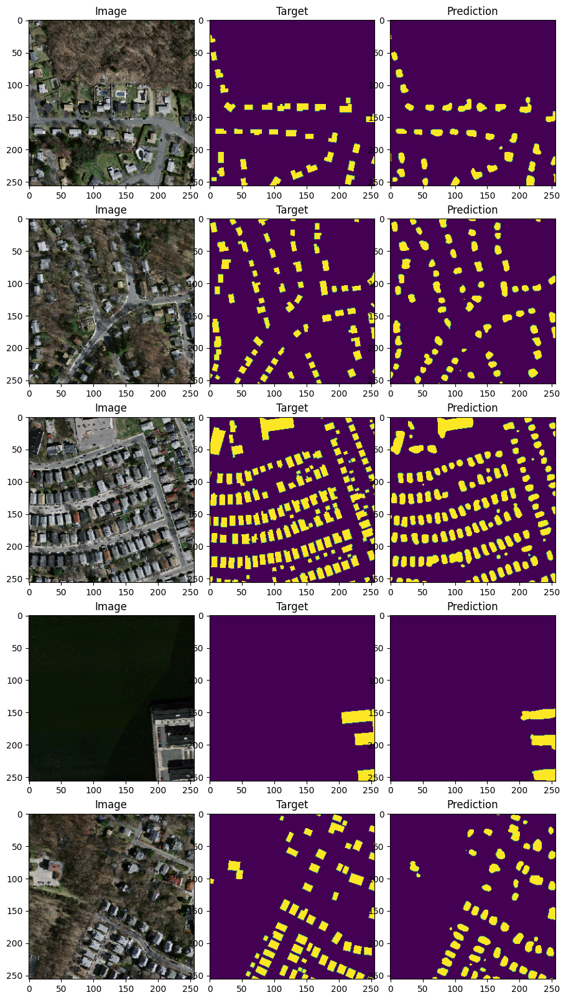

<Figure size 640x480 with 0 Axes>

In [14]:
from tqdm import tqdm
import time

start_time = time.time()
test_preds = []
with torch.no_grad():
    accuracy = 0
    model.eval() # Set model to evaluate mode.
    for (images, targets) in testset:
        images = images.to(device)[None]
        targets = targets.to(device)[None]

        # Forward pass.
        preds = model(images)

        # Statistics
        preds = (torch.sigmoid(preds) > 0.5)
        accuracy += metric(preds, targets) # IOU statistic.
        test_preds.append(preds)
    accuracy /= len(testset)

print(f"Finished Testing. Accuracy: {accuracy:.4f}")
print("Total time: {} minutes.".format(round((time.time() - start_time)/60, 2)))

test_preds = torch.cat(test_preds)
plot_dataset(testset, preds=test_preds.cpu(), file_name="BuildingsPred")

# Transfer Learning
In this part, the trained model from the building dataset is used to train a new model so it can recognize the roads in each image. As always, the images need to be preprocessed in the same way as explained earlier in oder to get into the model and start the training process.

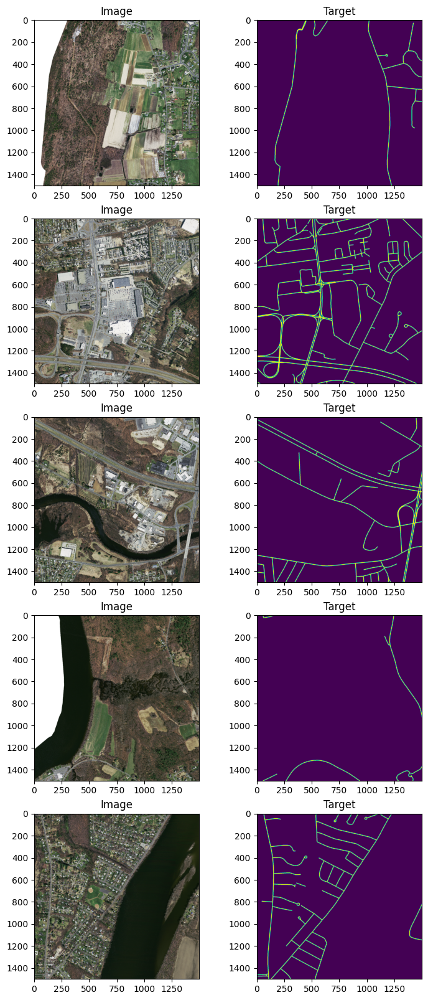

Dimension of image data: torch.Size([2234, 3, 256, 256]).
Dimension of target data: torch.Size([2234, 1, 256, 256]).


In [6]:
import torch

images = []
targets = []
patch_size = 256
dataset_path = "/kaggle/input/massachusettsroads/Train"
dataset = MassachusettsDataset(dataset_path)

plot_dataset(dataset)

for data in dataset:
    image = data[0]
    target = data[1]
    for i in range(0, image.shape[1]-patch_size, patch_size):
        for j in range(0, image.shape[2]-patch_size, patch_size):
            image_patch = image[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
            white_pixels = (image_patch[0,0] == 1).sum()
            if(white_pixels < 0.01*(patch_size**2)): # Less than 1% of the image is blank space (no information).
                target_patch = target[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
                black_pixels = np.unique(target_patch, return_counts=True)[1][0]
                if(black_pixels < 0.99*(patch_size**2)): # At least more tan 1% is road information.
                    images.append(image_patch)
                    targets.append(target_patch)
                
images = torch.cat(images)
targets = torch.cat(targets)

print(f"Dimension of image data: {images.shape}.")
print(f"Dimension of target data: {targets.shape}.")

As before, the preprocessed dataset is divided into groups before getting into the model.

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


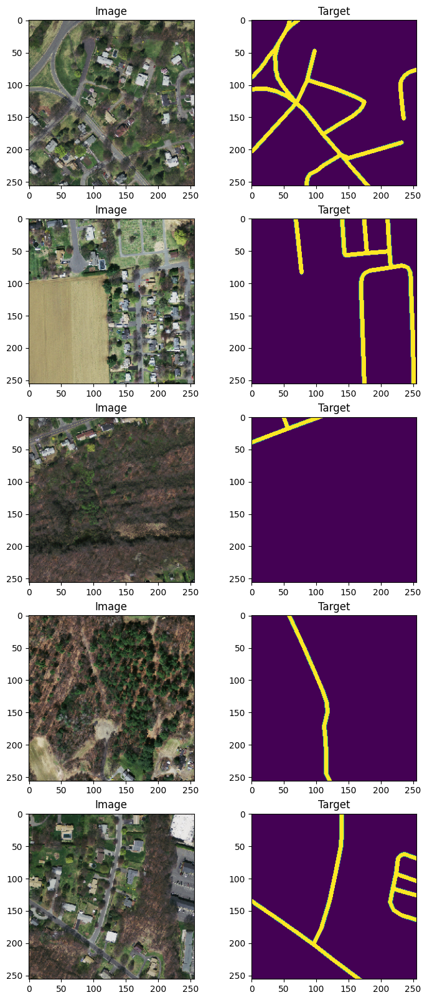

Size of trainset after spliting the dateset: 2010.
Size of testset after spliting the dateset: 224.
Size of train loader (with batch size 32): 63.
Size of test loader (with batch size 32): 7.


In [7]:
import torch
from sklearn.model_selection import train_test_split
from torch.utils.data import TensorDataset, DataLoader

dataset = train_test_split(images, targets, test_size=0.1, random_state=32)

trainset = TensorDataset(dataset[0], dataset[2]) # Creates your dataset.
testset = TensorDataset(dataset[1], dataset[3]) # Creates your dataset.

plot_dataset(testset)

print(f"Size of trainset after spliting the dateset: {len(trainset)}.")
print(f"Size of testset after spliting the dateset: {len(testset)}.")

batch_size = 32 # Hyperparameter.
pin_memory = True if torch.cuda.is_available() else False
train_loader = DataLoader(trainset, batch_size=batch_size, shuffle=True, pin_memory=pin_memory, num_workers=os.cpu_count()) # shuffle=True to reshuffle at every epoch.
test_loader = DataLoader(testset, batch_size=batch_size, shuffle=False, pin_memory=pin_memory, num_workers=os.cpu_count()) # shuffle=True to reshuffle at every epoch.

print(f"Size of train loader (with batch size {batch_size}): {len(train_loader)}.") # ceil(len(trainset)/batch_size).
print(f"Size of test loader (with batch size {batch_size}): {len(test_loader)}.") # ceil(len(testset)/batch_size).

# Configurations and Utilities
Here, the model hyperparameters and functions are specified, such as, the loss function, the metric function for the accuracy, the optimizer to update the parameters, etc. Since this is a binary class issue, the loss function to be used is the BCE loss function and the optimizer is the Adam function, and, IOU (Binary Jaccard) is used as a metric function for semantic segmentation.

In [8]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchmetrics import Dice
from torchmetrics.classification import BinaryJaccardIndex

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device being used: {device}.")

epochs = 10 # Hyperparameter.
lr = 0.001 # Hyperparameter.

model_path = "/kaggle/input/massachusettsbuildingsmodel/MassachusettsBuildings.pth"
model = Unet()
model.load_state_dict(torch.load(model_path)) # It takes the loaded dictionary, not the path file itself.
model = model.to(device=device) # Move the model parameters from CPU to GPU.

#criterion = nn.BCELoss() # Loss function.
criterion = nn.BCEWithLogitsLoss() # Sigmid and BCE loss function.
criterion = criterion.to(device=device) # Move the model parameters from CPU to GPU.

optimizer = optim.Adam(model.parameters(), lr=lr) # Hyperparameter.
# optimizer = optim.SGD(Model.parameters(), lr=LearningRate) # Hyperparameter.

lr_decay = lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.1) # Decay lr by a factor of 0.1 every 15 epochs.

metric = BinaryJaccardIndex() # IOU statistic.
# metric = Dice(average='micro')
metric = metric.to(device)

Device being used: cuda.


# Training Loop
All ready to train the model. In this loop, the training process is held. Since the parameters are initialized using the model from the buindings dataset (transfer learning), the amount of epochs are 10 (much less than before) and the learning rate is reduced to improve the process after some epoches (see the Configuration and Utilities cell).

In [9]:
from tqdm import tqdm
import time

start_time = time.time()
train_loss = []
test_loss = []
best_loss = float('inf')
best_model = model.state_dict()
for epoch in range(epochs):
    train_loss.append(0)
    model.train() # Set model to training mode.
    for (images, targets) in tqdm(train_loader, total=len(train_loader)):
        images = images.to(device)
        targets = targets.to(device)
                                          
        # Forward pass.
        preds = model(images)
        loss = criterion(preds, targets.type(torch.float32))
        #loss = 1-metric(preds, targets)
        train_loss[-1] += loss.item()

        # Backward and optimize.
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    train_loss[-1] /= (len(trainset)/batch_size)
            
    with torch.no_grad():
        test_loss.append(0)
        accuracy = 0
        model.eval() # Set model to evaluate mode.
        for (images, targets) in tqdm(test_loader, total=len(test_loader)):
            images = images.to(device)
            targets = targets.to(device)
        
            # Forward pass.
            preds = model(images)
            loss = criterion(preds, targets.type(torch.float32))
            #loss = 1-metric(preds, targets)
            test_loss[-1] += loss.item()
            
            # Statistics
            preds = (torch.sigmoid(preds) > 0.5)
            accuracy += metric(preds, targets) # IOU statistic.
        test_loss[-1] /= (len(testset)/batch_size)
        accuracy /= (len(testset)/batch_size)
        
        # Records the best accuracy.
        if(best_loss > test_loss[-1]): 
            best_loss = test_loss[-1]
            best_model = model.state_dict()

    lr_decay.step()
    print (f"Epoch: {epoch+1}/{epochs}, Train loss: {train_loss[-1]:.4f}, Test loss: {test_loss[-1]:.4f}, Accuracy: {accuracy:.4f}.")

print(f"Finished Training. Best loss: {best_loss:.4f}")
print("Total time: {} minutes.".format(round((time.time() - start_time)/60, 2)))

100%|██████████| 7/7 [00:04<00:00,  1.47it/s]


Epoch: 1/10, Train loss: 0.1385, Test loss: 0.1065, Accuracy: 0.5368.


100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


Epoch: 2/10, Train loss: 0.0944, Test loss: 0.0965, Accuracy: 0.5787.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 3/10, Train loss: 0.0849, Test loss: 0.0887, Accuracy: 0.5754.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 4/10, Train loss: 0.0805, Test loss: 0.0932, Accuracy: 0.5638.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 5/10, Train loss: 0.0771, Test loss: 0.0827, Accuracy: 0.6049.


100%|██████████| 7/7 [00:04<00:00,  1.44it/s]


Epoch: 6/10, Train loss: 0.0711, Test loss: 0.0748, Accuracy: 0.6438.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 7/10, Train loss: 0.0696, Test loss: 0.0746, Accuracy: 0.6418.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 8/10, Train loss: 0.0688, Test loss: 0.0744, Accuracy: 0.6426.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]


Epoch: 9/10, Train loss: 0.0683, Test loss: 0.0744, Accuracy: 0.6452.


100%|██████████| 7/7 [00:04<00:00,  1.45it/s]

Epoch: 10/10, Train loss: 0.0676, Test loss: 0.0735, Accuracy: 0.6437.
Finished Training. Best loss: 0.0735
Total time: 24.37 minutes.


Now, a plot is made to show the training loss during the  training process.

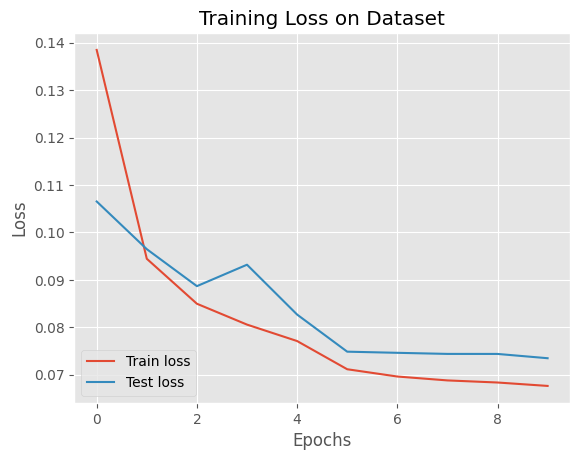

In [10]:
plot_path = "/kaggle/working/TrainingLoss.png"

# Plot the training loss.
plt.style.use("ggplot")
plt.figure()
plt.plot(train_loss, label="Train loss")
plt.plot(test_loss, label="Test loss")
plt.title("Training Loss on Dataset")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend(loc="lower left")
plt.savefig(plot_path)

Then, the trained model is saved as it will be used for testing the model.

In [11]:
model_path = "/kaggle/working/MassachusettsRoads.pth"
torch.save(best_model, model_path)

# Testing Process
The trained model is tested with some new images which weren't used in the training process. First, the images form the testset are to be preprocessed and patched the same way as the images form the trainig process.

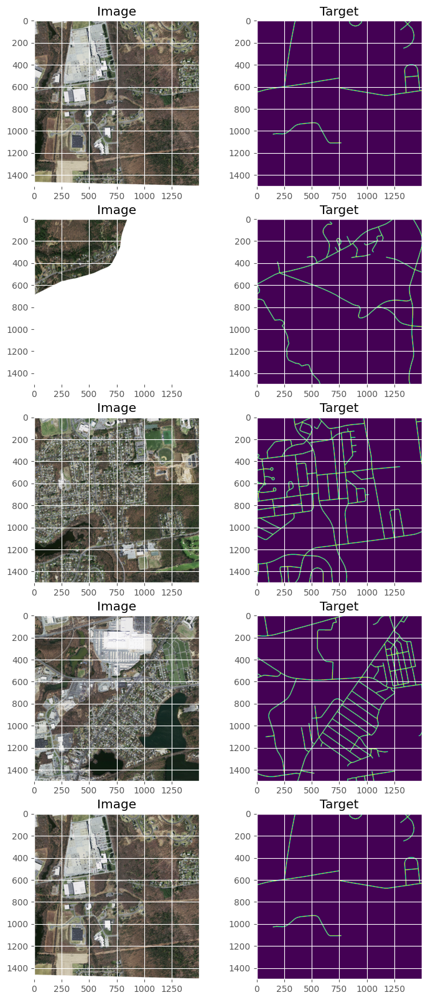

Dimension of image data: torch.Size([267, 3, 256, 256]).
Dimension of target data: torch.Size([267, 1, 256, 256]).


<Figure size 640x480 with 0 Axes>

In [12]:
import torch

images = []
targets = []
patch_size = 256
dataset_path = "/kaggle/input/massachusettsroads/Test"
dataset = MassachusettsDataset(dataset_path)

plot_dataset(dataset, file_name="Roads")

for data in dataset:
    image = data[0]
    target = data[1]
    for i in range(0, image.shape[1]-patch_size, patch_size):
        for j in range(0, image.shape[2]-patch_size, patch_size):
            image_patch = image[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
            white_pixels = (image_patch[0,0] == 1).sum()
            if(white_pixels < 0.01*(patch_size**2)): # Less than 1% of the image is blank space (no information).
                target_patch = target[None,:,i:i+patch_size,j:j+patch_size] # "None" to expand dimension.
                black_pixels = np.unique(target_patch, return_counts=True)[1][0]
                if(black_pixels < 0.99*(patch_size**2)): # At least more than 1% is road information.
                    images.append(image_patch)
                    targets.append(target_patch)
                
images = torch.cat(images)
targets = torch.cat(targets)

print(f"Dimension of image data: {images.shape}.")
print(f"Dimension of target data: {targets.shape}.")

Some random images from the testset are plotted.

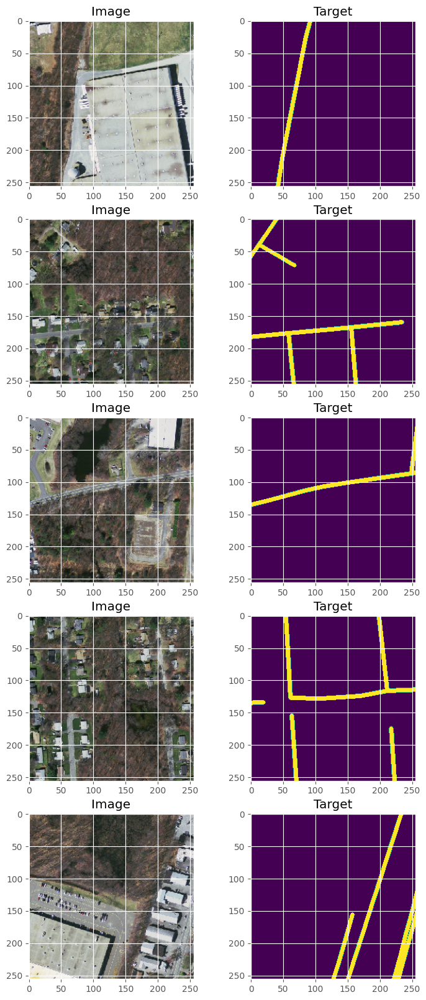

Size of testset after spliting the dateset: 267.


<Figure size 640x480 with 0 Axes>

In [13]:
import torch
from torch.utils.data import TensorDataset, DataLoader

testset = TensorDataset(images, targets) # Creates your dataset.

plot_dataset(testset, file_name="RoadsPatch")

print(f"Size of testset after spliting the dateset: {len(testset)}.")

# Configurations and Utilities
Now, the saved model is used to recognize the roads in each image. This way, the accuracy of this model is checked. 

In [14]:
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
from torchmetrics import Dice
from torchmetrics.classification import BinaryJaccardIndex

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Device being used: {device}.")

# model_path = "/kaggle/input/massachusettsbuldingsmodel/MassachusettsBuldings.pth"
model = "/kaggle/working/MassachusettsRoads.pth"
model = Unet()
model.load_state_dict(torch.load(model_path, map_location=device)) # It takes the loaded dictionary, not the path file itself.
model = model.to(device=device) # Move the model parameters from CPU to GPU.

#criterion = nn.BCELoss() # Loss function.
criterion = nn.BCEWithLogitsLoss() # Sigmid and BCE loss function.
criterion = criterion.to(device=device) # Move the model parameters from CPU to GPU.

metric = BinaryJaccardIndex() # IOU statistic.
# metric = Dice(average='micro')
metric = metric.to(device)

Device being used: cuda.


# Testing Loop
Similar to the Training Loop cell. Here, the accuracy is only in the loop, the loss function and the optimazer are not necessary because the model is not being trained. In the end, the images are ploted to compare the targets with the predictions made by the trained model. An accuracy of 60.3% is achieved.

Finished Testing. Accuracy: 0.6030
Total time: 0.04 minutes.


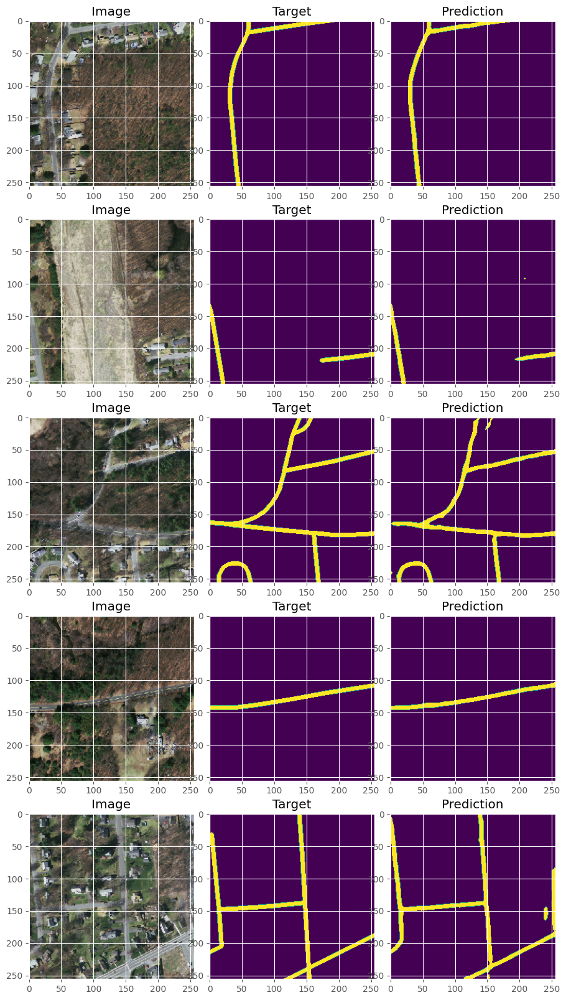

<Figure size 640x480 with 0 Axes>

In [15]:
from tqdm import tqdm
import time

start_time = time.time()
test_preds = []
with torch.no_grad():
    accuracy = 0
    model.eval() # Set model to evaluate mode.
    for (images, targets) in testset:
        images = images.to(device)[None]
        targets = targets.to(device)[None]

        # Forward pass.
        preds = model(images)

        # Statistics
        preds = (torch.sigmoid(preds) > 0.5)
        accuracy += metric(preds, targets) # IOU statistic.
        test_preds.append(preds)
    accuracy /= len(testset)

print(f"Finished Testing. Accuracy: {accuracy:.4f}")
print("Total time: {} minutes.".format(round((time.time() - start_time)/60, 2)))

test_preds = torch.cat(test_preds)
plot_dataset(testset, preds=test_preds.cpu(), file_name="RoadsPred")